# Análisis Exploratorio de Datos

Comenzamos comprobando la versión de Python con la que estamos trabajando. Este curso se impartirá en Python 3.8.1 por lo que te recomiendo que tengas la misma versión o una más avanzada para seguirlo, si no podrías encontrar pequeños errores debidos a los cambios que Python realizada en cada versión.

In [1]:
import sys
print(sys.version)

3.12.10 (v3.12.10:0cc81280367, Apr  8 2025, 08:47:00) [Clang 13.0.0 (clang-1300.0.29.30)]


En este cuaderno exploraremos distintas técnicas de análisis de datos sobre datasets. Antes de afrontar un problema de Machine Learning es necesario comprender los datos con los que estamos trabajando y realizar labores de preprocesamiento que nos permitan trabajar con ellos. En este notebook emplearemos cuatro módulos:

* __NumPy.__ Módulo para la realización de operaciones algebraicas con matrices y vectores.
* __Pandas.__ Módulo para la construcción y manipulación de DataFrames.
* __Matplotlib.__ Módulo para la visualización de datos. Permite construir diversos tipos de gráficos.
* __Seaborn.__ Módulo para la visualización de datos. Lo emplearemos para la construcción de mapas de calor.

Si no has trabajado con estos módulos previamente te saldrá un error similar al siguiente al tratar de importarlos:

In [1]:
import pandas

Esto indica que el módulo no se puede importar porque el paquete no ha sido instalado. Para instalar el paquete simplemente usamos la expresión: `!pip install nombre_paquete` 

En el caso concreto de pandas:

In [3]:
!pip install pandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 12.1 MB/s eta 0:00:001m12.6 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 15.0 MB/s eta 0:00:000:00:01m eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4/4 [pandas]━━━━ 3/4 [pandas]


__Nota.__ Asegúrate de tener una conexión estable a internet a la hora de instalar nuevos módulos pues será necesario para descargarlos.

Análogamente:

In [4]:
!pip install matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.2/8.2 MB 12.0 MB/s eta 0:00:00 MB/s eta 0:00:01:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 15.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7/7 [matplotlib] 6/7 [matplotlib]ow]


In [5]:
!pip install seaborn

La distribución de pandas incluye numpy por lo que ya hemos realizado todas las instalaciones necesarias y podemos importar los módulos:

In [5]:
import pandas as pd
import numpy as np
import matplotlib as plt
import seaborn as sns

__Nota.__ Los módulos se importan con una pequeña abreviatura estándar para ahorrar tiempo y poder escribir pd/np en lugar de pandas/numpy cada vez que utilizamos uno de sus módulos.

Ahora que ya tenemos los módulos necesario procedemos en primer lugar a cargar los datos en el notebook.

## Carga de datos

Tras observar los datos estudiamos el comando `pandas.read_csv()`:

In [6]:
help(pd.read_csv)

Help on function read_csv in module pandas.io.parsers.readers:

read_csv(filepath_or_buffer: 'FilePath | ReadCsvBuffer[bytes] | ReadCsvBuffer[str]', *, sep: 'str | None | lib.NoDefault' = <no_default>, delimiter: 'str | None | lib.NoDefault' = None, header: "int | Sequence[int] | None | Literal['infer']" = 'infer', names: 'Sequence[Hashable] | None | lib.NoDefault' = <no_default>, index_col: 'IndexLabel | Literal[False] | None' = None, usecols: 'UsecolsArgType' = None, dtype: 'DtypeArg | None' = None, engine: 'CSVEngine | None' = None, converters: 'Mapping[Hashable, Callable] | None' = None, true_values: 'list | None' = None, false_values: 'list | None' = None, skipinitialspace: 'bool' = False, skiprows: 'list[int] | int | Callable[[Hashable], bool] | None' = None, skipfooter: 'int' = 0, nrows: 'int | None' = None, na_values: 'Hashable | Iterable[Hashable] | Mapping[Hashable, Iterable[Hashable]] | None' = None, keep_default_na: 'bool' = True, na_filter: 'bool' = True, verbose: 'bool | 

In [7]:
pokemon_data = pd.read_csv('./data/Pokemon.csv') #en Windows se usaría la \ en lugar de / para indicar la ruta del archivo

Podemos visualizar los datos que acabamos de cargar:

In [8]:
pokemon_data

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,719,Diancie,Rock,Fairy,600,50,100,150,100,150,50,6,True
796,719,DiancieMega Diancie,Rock,Fairy,700,50,160,110,160,110,110,6,True
797,720,HoopaHoopa Confined,Psychic,Ghost,600,80,110,60,150,130,70,6,True
798,720,HoopaHoopa Unbound,Psychic,Dark,680,80,160,60,170,130,80,6,True


In [72]:
pokemon_data.__class__

pandas.core.frame.DataFrame

Tras esto los datos ya se han cargado en nuestro cuaderno. Podemos obtener una previsualización de los datos mediante el método `head()` que por defecto nos muestra las 5 primeras filas:

In [12]:
pokemon_data.head()

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,False


Podemos indicarle cuántas filas deseamos que nos muestre:

In [13]:
pokemon_data.head(6)

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,False
5,5,Charmeleon,Fire,NaN,405,58,64,58,80,65,80,1,False


El método tail previsualiza las últimas filas en lugar de las primeras:

In [14]:
pokemon_data.tail()

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
795,719,Diancie,Rock,Fairy,600,50,100,150,100,150,50,6,True
796,719,DiancieMega Diancie,Rock,Fairy,700,50,160,110,160,110,110,6,True
797,720,HoopaHoopa Confined,Psychic,Ghost,600,80,110,60,150,130,70,6,True
798,720,HoopaHoopa Unbound,Psychic,Dark,680,80,160,60,170,130,80,6,True
799,721,Volcanion,Fire,Water,600,80,110,120,130,90,70,6,True


Una buena medida para comprobar que se han cargado todos los datos y hacernos una idea del tamaño de dato con el que estamos trabajando es comprobar sus dimensiones mediante el atributo `shape`:

In [15]:
pokemon_data.shape

(800, 13)

En este caso nuestro conjunto de datos consta de 800 filas y 13 columnas.

Otra comprobación interesante es el tipo de dato almacenado en cada columna que se obtiene mediante el atributo `dtypes`:

In [36]:
pokemon_data.dtypes

#              int64
Name          object
Type 1        object
Type 2        object
Total          int64
HP             int64
Attack         int64
Defense        int64
Sp. Atk        int64
Sp. Def        int64
Speed          int64
Generation     int64
Legendary       bool
dtype: object

En este caso tenemos cuatro variables categóricas, _name_, _Type 1_,_Type 2_ y _Legendary_ siendo el resto de variables cuantitativas.

Ahora que ya hemos hecho una aproximación a los datos nos detendremos brevemente en comprender cada variable. Esta información suele venir adjunta al conjunto de datos y recibe el nombre de __diccionario de datos__. Explica el signficado real de cada variable y la unidad en la que ha sido medida y es de vital importancia para comprender el problema

### Diccionario de datos

Las variables presentes en este dataset son:

* __#__. Es un índice numérico. Una variable identificativa sin información para el problema. __Ojo.__ Veremos que si es útil para la exploración de datos.
* __Name__. Es el nombre del Pokèmon.
* __Type 1__. Tipo principal del Pokèmon.
* __Type 2__. Tipo secundario del Pokèmon.
* __Total__. La suma de todas las estadística de batallas, busca dar una indicación de la fuerza total del Pokèmon.
* __HP__. Puntos de salud del Pokèmon.
* __Attack__. Puntos ofensivos del Pokèmon.
* __Defense__. Puntos defensivos del Pokèmon.
* __Sp. Atk__. Puntos ofensivos del ataque especial del Pokèmon
* __Sp. Def__. Puntos defensivos de la defensa especial del Pokèmon
* __Speed__. Velocidad del Pokèmon.
* __Generation__. Generación en la que aparece el Pokèmon.
* __Legendary__. Indica si el Pokèmon es o no legendario.

Ahora que comprendemos los datos podemos explorarlos más en profundidad.

***


## Estadística de las variables

En este caso deben tratarse de manera diferente variables cuantitativas y cualitativas.

### Variables cualitativas

__Reminder.__ Variables cualitativas son aquellas que toman un número finito de valores. En nuestro caso las variables cualitativas son los nombres, el tipo principal y secundario y el indicador de si es legendario.

Podemos comenzar viendo cuántos valores distintos toma cada variable:

In [17]:
pokemon_data.head()

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,False


El método `nunique()` nos devuelve el número de valores distintos que toma una variable:

In [18]:
pokemon_data['Type 1'].nunique()

18

Además en ocasiones podemos estar interesados en saber cómo se distribuyen estos valores así que usando el método `value_counts()` podemos obtener el detalle de cada clase junto con el número apariciones ordenadas de mayor a menor:

In [19]:
pokemon_data['Type 1'].value_counts()

Type 1
Water       112
Normal       98
Grass        70
Bug          69
Psychic      57
Fire         52
Rock         44
Electric     44
Ground       32
Ghost        32
Dragon       32
Dark         31
Poison       28
Fighting     27
Steel        27
Ice          24
Fairy        17
Flying        4
Name: count, dtype: int64

Por lo tanto tenemos 18 clases que podemos observar que no están balanceadas, solo existen cuatro Pokèmons de tipo volador frente a 112 de tipo agua.

Análogamente para el tipo secundario:

In [20]:
pokemon_data['Type 2'].nunique()

18

In [21]:
pokemon_data['Type 2'].value_counts()

Type 2
Flying      97
Ground      35
Poison      34
Psychic     33
Fighting    26
Grass       25
Fairy       23
Steel       22
Dark        20
Dragon      18
Ice         14
Rock        14
Water       14
Ghost       14
Fire        12
Electric     6
Normal       4
Bug          3
Name: count, dtype: int64

De nuevo tenemos 18 clases y bastante disparidad. Es curioso que en este caso volador aparece como tipo secundario más frecuente y normal que era el segundo tipo principal más frecuente aparece en penúltima posición.

La variable nombre sin embargo presenta:

In [22]:
pokemon_data['Name'].nunique()

800

Si recordamos este es el número total de filas:

In [23]:
pokemon_data.shape

(800, 13)

Por lo que tiene un valor único para cada fila.

__Nota.__ Cuando una variable tiene un valor único para cada fila esta variable no almacena información relevante a la hora de construir un modelo. Puede ser una variable con información relevante, por ejemplo, es interesante conocer el nombre de cada Pokèmon pero no aporta información para un modelo pues no se puede generalizar. Es importante conocer el nombre de un cliente en un banco pero no será una variable relevante a la hora de decidir si se le concede o no un crédito.

Por último en la variable de tipo bool sabemos que solo existen dos posibles valores True o False por lo que observamos cómo se distribuyen:

In [24]:
pokemon_data['Legendary'].value_counts()

Legendary
False    735
True      65
Name: count, dtype: int64

In [25]:
pokemon_data['Generation'].nunique()

6

Observamos que existen 65 legendario frente a 735 no legendarios. Son dos clases muy desbalanceadas, esto ocurre precisamente porque los Pokèmon legendarios son considerados más especiales que los no legendarios.

Por último, si prestamos atención a las variables descubriremos que _Generation_ es en realidad una variable categórica. Solo toma seis valores (1, 2, 3, 4, 5 y 6). Realmente se podrían sustituir los números por letras, por ejemplo, generación A, B, C... por lo que la trataremos como una variable cualitativa:



In [26]:
pokemon_data['Generation'].value_counts().sort_index() #ordenamos por índice para que sea más comprensible

Generation
1    166
2    106
3    160
4    121
5    165
6     82
Name: count, dtype: int64

En el análisis de datos no es solo importante los resultados si no las preguntas que nos podemos plantear en torno a ellos, por ejemplo, ¿vista esta distribución están las clases equilibradas? ¿A qué puede deberse el desequilibrio? ¿Es una base completa? ¿Se podría completar?

Hasta aquí hemos estudiado las variable cualitativas. Veamos ahora que pasa con las cuantitativas.

***

### Variables cuantitativas

__Reminder.__ Las variables cuantitativas son aquellas que pueden tomar un número infinito de valores.

En este caso para explorar cómo se distribuyen las variables recurriremos a estadísticos básicos como son la media, la mediana, la varianza, el mínimo, el máximo...

Las variables cuantitativas en una primera aproximación son: _#, Total, HP, Attack, Defense, Sp. Atk, Sp.Def, Speed._

Comencemos analizando la variable total:

In [29]:
print('La media de Total es:', pokemon_data['Total'].mean())
print('La mediana de Total es:', pokemon_data['Total'].median())
print('El valor mínimo de Total es:', pokemon_data['Total'].min())
print('El valor máximo de Total es:', pokemon_data['Total'].max())
print('La varianza de Total es:', pokemon_data['Total'].var())

La media de Total es: 435.1025
La mediana de Total es: 450.0
El valor mínimo de Total es: 180
El valor máximo de Total es: 780
La varianza de Total es: 14391.13090738423


In [27]:
pokemon_data['Total'].mean()

np.float64(435.1025)

Este rápido análisis numérico nos permite comprender que variable está distribuida de una manera bastante equilibrada (la media y la mediana se encuentran relativamente próxima). La varianza junto con los valores mínimos y máximos confirman que la variable toma un amplio rango de valores (180 a 780 puntos).

Ete problema es relativamente sencillo y emplea pocas variables pero qué ocurre si nos enfrentamos a un problema con 50 variables. Podemos emplear el método `describe( )`:

In [37]:
pokemon_data.describe()

,#,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation
count,800.000000,800.00000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.00000
mean,362.813750,435.10250,69.258750,79.001250,73.842500,72.820000,71.902500,68.277500,3.32375
std,208.343798,119.96304,25.534669,32.457366,31.183501,32.722294,27.828916,29.060474,1.66129
min,1.000000,180.00000,1.000000,5.000000,5.000000,10.000000,20.000000,5.000000,1.00000
25%,184.750000,330.00000,50.000000,55.000000,50.000000,49.750000,50.000000,45.000000,2.00000
50%,364.500000,450.00000,65.000000,75.000000,70.000000,65.000000,70.000000,65.000000,3.00000
75%,539.250000,515.00000,80.000000,100.000000,90.000000,95.000000,90.000000,90.000000,5.00000
max,721.000000,780.00000,255.000000,190.000000,230.000000,194.000000,230.000000,180.000000,6.00000


__Ojo.__ Este método resulta muy útil pero es importante observar que realizará el análisis sobre todas las variables de tipo numérico, sin importar si son cualitativas o cuantitativas (si nos fijamos aparece Generation).

El método nos presenta para cada variable codificada como un número (que no cuantitativa):

* Count. Número de registros no nulos. En ocasiones podemos no disponer de cierta información de un Pokèmon concreto apareciendo un hueco en el lugar donde debería estar. 
* Mean. La media de la distribución de la variable.
* Std. La desviación estándar (raíz de la varianza) de la distribución de la variable.
* Min. El valor mínimo que toma la variable.
* Max. El valor máximo que toma la variable.
* 25%, 50%, 75%. Son los cuartiles de la distribución de la variable.

***
## Valores perdidos

Los valores perdidos en un dataset son aquellos que se desconocen. Sus causas de origen son diversas, mala ingesta de datos, mal procesamiento de los datos, cambios en la forma de recopilación del dato, negativa de los encuestados a comunicarlos. 

A la hora de detectar los valores empleamos el método `isna( )`:

In [38]:
pokemon_data.isna().sum()

#               0
Name            0
Type 1          0
Type 2        386
Total           0
HP              0
Attack          0
Defense         0
Sp. Atk         0
Sp. Def         0
Speed           0
Generation      0
Legendary       0
dtype: int64

Observamos que todas las variables se encuentran completas exceptuando el campo tipo secundario en 386 casos. En el siguiente cuaderno veremos maneras de imputar valores perdidos.

***

## Matriz de correlación

La correlación es la medida que  dos variables numéricas presentan una relación lineal, es decir, una relación que aumenta o disminuye a un ritmo constante.

__Nota.__ Esto se explicará en más profundidad y con ejemplos en el próximo módulo. De momento solo es importante conocer su cálculo mediante Python:


In [56]:
# Solo columnas numéricas
corr_0 = pokemon_data.corr(numeric_only=True)


In [58]:
corr_0

,#,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
#,1.000000,0.119813,0.097614,0.102298,0.094786,0.088759,0.085817,0.010733,0.982516,0.153396
Total,0.119813,1.000000,0.618748,0.736211,0.612787,0.747250,0.717609,0.575943,0.048384,0.501758
HP,0.097614,0.618748,1.000000,0.422386,0.239622,0.362380,0.378718,0.175952,0.058683,0.273620
Attack,0.102298,0.736211,0.422386,1.000000,0.438687,0.396362,0.263990,0.381240,0.051451,0.345408
Defense,0.094786,0.612787,0.239622,0.438687,1.000000,0.223549,0.510747,0.015227,0.042419,0.246377
Sp. Atk,0.088759,0.747250,0.362380,0.396362,0.223549,1.000000,0.506121,0.473018,0.036437,0.448907
Sp. Def,0.085817,0.717609,0.378718,0.263990,0.510747,0.506121,1.000000,0.259133,0.028486,0.363937
Speed,0.010733,0.575943,0.175952,0.381240,0.015227,0.473018,0.259133,1.000000,-0.023121,0.326715
Generation,0.982516,0.048384,0.058683,0.051451,0.042419,0.036437,0.028486,-0.023121,1.000000,0.079794
Legendary,0.153396,0.501758,0.273620,0.345408,0.246377,0.448907,0.363937,0.326715,0.079794,1.000000


En la matriz de correlación observamos que aparecen las variables `Generation` y `Legendary`. La correlación solamente se calcula sobre variables cuantitativas por lo que no debe aparecer. Generamos un dataframe provisional para calcular correlación:

In [53]:
pokemon_quantitative_data = pokemon_data[['Total', 'HP', 'Attack', 'Defense', 'Sp. Atk', 'Sp. Def', 'Speed']] #seleccionamos manualmente las variables cuantitativas
correlation_matrix = pokemon_quantitative_data.corr()
correlation_matrix

,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed
Total,1.000000,0.618748,0.736211,0.612787,0.747250,0.717609,0.575943
HP,0.618748,1.000000,0.422386,0.239622,0.362380,0.378718,0.175952
Attack,0.736211,0.422386,1.000000,0.438687,0.396362,0.263990,0.381240
Defense,0.612787,0.239622,0.438687,1.000000,0.223549,0.510747,0.015227
Sp. Atk,0.747250,0.362380,0.396362,0.223549,1.000000,0.506121,0.473018
Sp. Def,0.717609,0.378718,0.263990,0.510747,0.506121,1.000000,0.259133
Speed,0.575943,0.175952,0.381240,0.015227,0.473018,0.259133,1.000000


__Nota.__ Las matrices de correlación son siempre simétricas. La correlación del ataque con la defensa, será igual que la de la defensa con el ataque.

## Visualización de los datos

Hasta ahora hemos estado sacando los coeficientes más relevantes a la hora de explorar un conjunto de datos, pero ¿qué ocurre si nos encontramos ante un conjunto de datos con 50 variables? Necesitamos un métodos que nos permita explorar el conjunto más rápido. Aquí es donde entra en juego la visualización de los datos. A continuación se construyen funciones para la representación más relevante de las variables.

### Variables categóricas

Construimos la siguiente función que se puede emplear en cualquier dataset, no solo en este en el que estamos trabajando. Emplearemos gráficos de barras para visualizar variables categóricas:

In [65]:
def plot_categorical_variables(dataframe, list_categorical_columns):
    for variable in list_categorical_columns: # recorremos las variable categóricas
        plt.pyplot.figure() # creamos la figura
        dataframe[variable].value_counts().sort_index().plot(kind='bar', title=variable) # rellenamos la figura con un gráfico de barras

In [66]:
categorical_variables = ['Type 1', 'Type 2', 'Generation', 'Legendary']

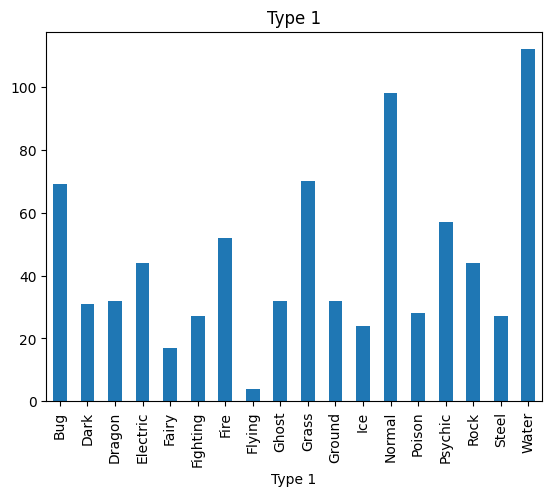

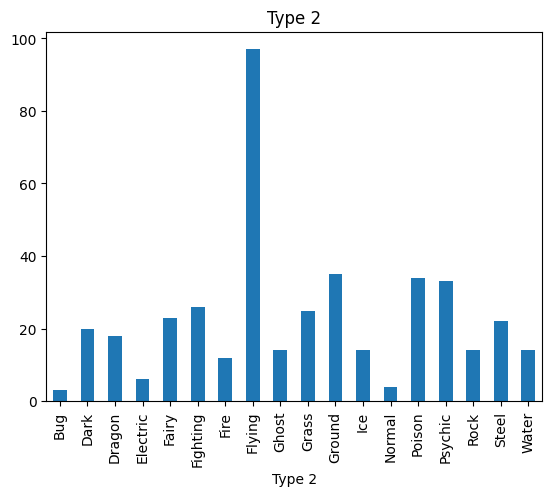

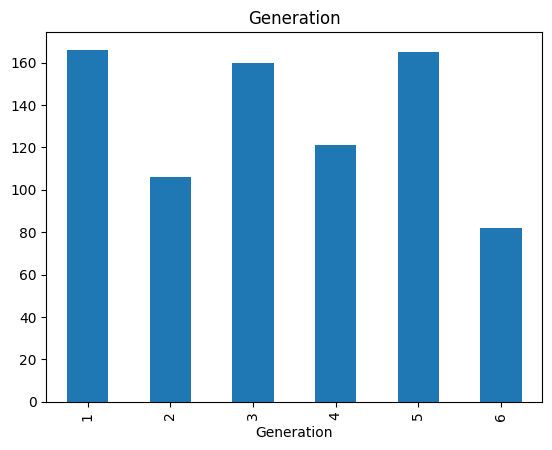

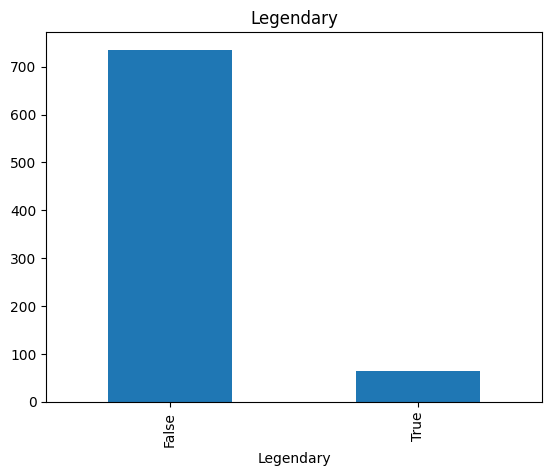

In [67]:
plot_categorical_variables(pokemon_data, categorical_variables)

### Variables cuantitativas

En el caso de las variables cuantitativas emplearemos histogramas para visualizar su distribución. De nuevo esta función es reutilizable en otros datasets:

In [68]:
def plot_quantitative_variables(dataframe, list_quantitative_columns):
    for variable in list_quantitative_columns:
        plt.pyplot.figure()
        dataframe[variable].plot(kind = 'hist', title=variable)

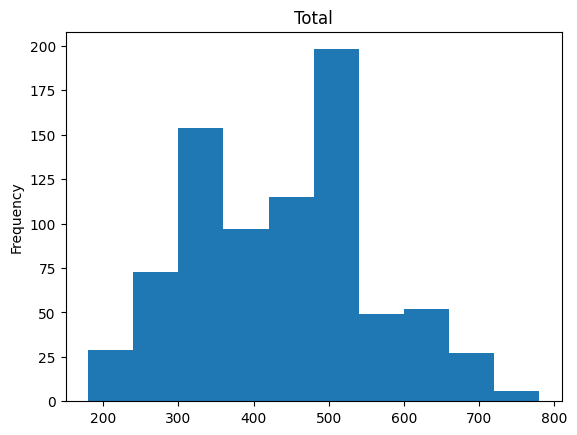

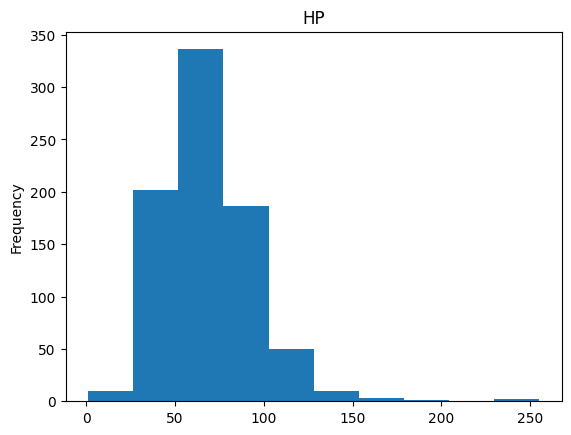

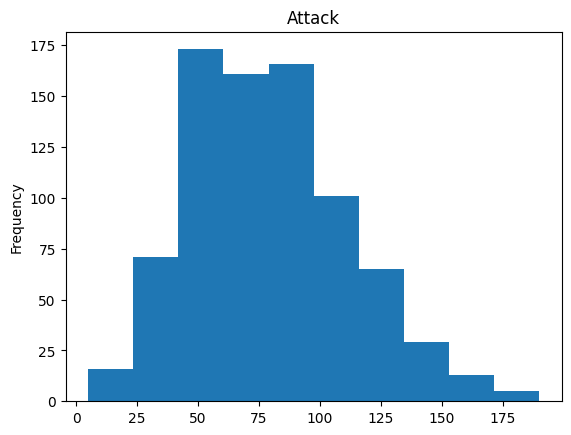

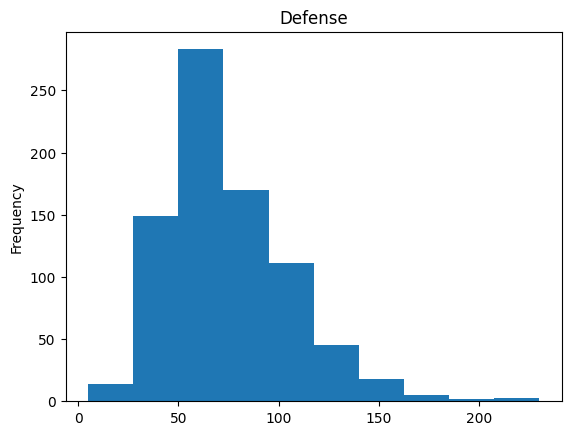

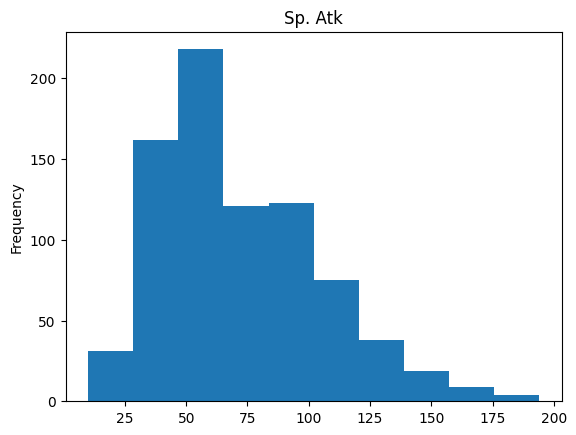

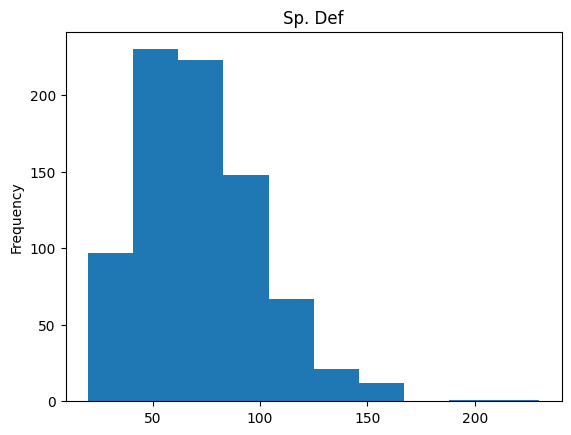

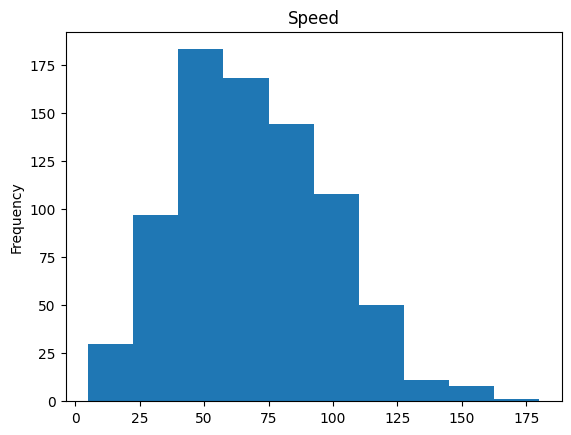

In [70]:
plot_quantitative_variables(pokemon_data, quantitative_variables)

In [69]:
quantitative_variables = ['Total', 'HP', 'Attack', 'Defense', 'Sp. Atk', 'Sp. Def', 'Speed']

### Correlación

Por último se puede construir un mapa de calor para visualizar las correlaciones entre variables de manera rápida y general. La matriz de correlaciones puede tomar dimensiones desproporcionadas cuando se trabaja con muchas variables:

[[False False False False False False False]
 [False False False False False False False]
 [False False False False False False False]
 [False False False False False False False]
 [False False False False False False False]
 [False False False False False False False]
 [False False False False False False False]]
[[ True  True  True  True  True  True  True]
 [False  True  True  True  True  True  True]
 [False False  True  True  True  True  True]
 [False False False  True  True  True  True]
 [False False False False  True  True  True]
 [False False False False False  True  True]
 [False False False False False False  True]]


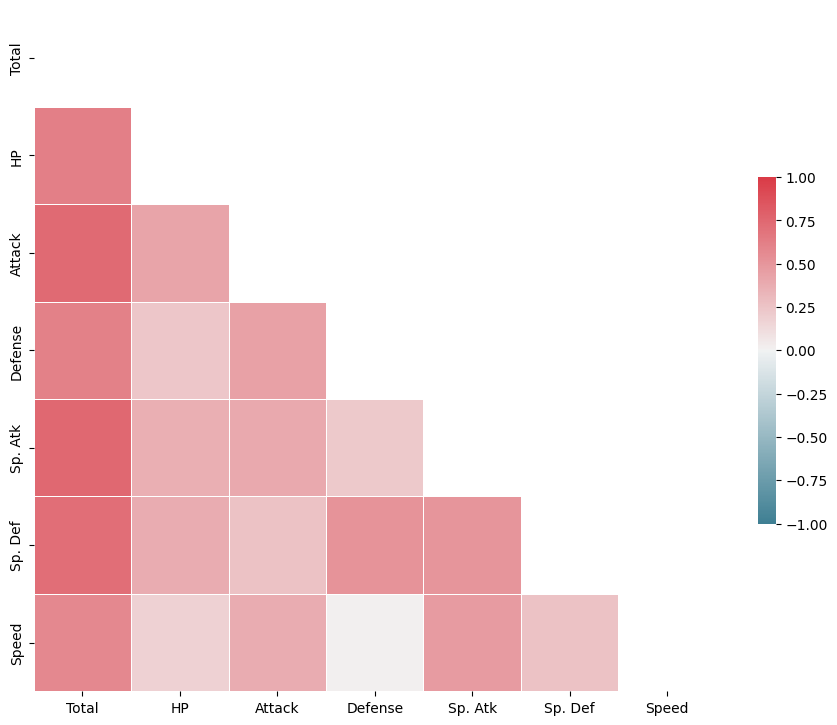

In [91]:
# Generamos una máscara para el triángulo superior
mask = np.zeros_like(correlation_matrix, dtype=np.bool) #devuelve una matriz de ceros del tamaño de matriz correlación
print(mask)
mask[np.triu_indices_from(mask)] = True #selecciona los valores inferiores
print(mask)
# Construimos la figura en matplotlib
f, ax = plt.pyplot.subplots(figsize=(11, 9))

# Generamos el mapa de calor
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Dibujamos el mapa usando la máscara y añadiendo algunos parámetros que mejoran la visualización
sns.heatmap(correlation_matrix, mask=mask, cmap=cmap, vmax=1,vmin=-1, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5});

__Nota.__ Representamos solo media matriz porque es simétrica. Representando solo una de las dos mitades facilitamos la lectura sin mostrar información redundante (este es de hecho uno de los principios básicos de la visualización de datos).

***

Hasta aquí hemos visto las partes más relevantes del análisis exploratorio de datos. El código presentado en este cuaderno puede ser adaptado y reutilizado para cualquier dataset y supondrá un buen punto de partida a la hora de enfrentarnos a un nuevo problema o a un nuevo conjunto de datos.

## Perfilado de datos

Para finalizar se presenta una pequeña herramienta de Pandas que genera un informe automático de las variables de un dataframe de manera rápida y automatizada:

In [10]:
pip install ydata-profiling ipywidgets


Note: you may need to restart the kernel to use updated packages.


In [1]:
from ydata_profiling import ProfileReport

In [9]:
profile = ProfileReport(pokemon_data)
profile.to_file('pokemon_report.html')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 50.71it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

En este notebook hemos realizado un análisis exploratorio que nos ha permitido comenzar a comprender los pilares del análisis de datos. Hemos calculado los estadísticos más relevantes y generado visualizaciones que nos permiten comprender y explicar mejor los datos. Además hemos visto algunas de las preguntas que debemos plantearnos al atacar un nuevo conjunto de datos ¿qué información relevan sus variables? ¿Son distribuciones equilibradas? ¿Tenemos huecos en nuestros datos? 

A lo largo de todo este curso usaremos este notebook como plantilla para explorar los distintos conjuntos de datos con los que trabajaremos.